# Practice 5 — FFT: Gaussian HPF and periodic noise removal

Tasks:
1) Implement Gaussian high-pass filtering.
2) Remove periodic noise via notch filters in the frequency domain.

Input: `/mnt/data/periodic_noise.JPG`

In [1]:
IMG_PATH = "/mnt/data/periodic_noise.JPG"
print("Using image:", IMG_PATH)


Using image: /mnt/data/periodic_noise.JPG


## Imports and utilities

In [2]:

import numpy as np, cv2, matplotlib.pyplot as plt

def imread_gray(path):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise FileNotFoundError(path)
    return img

def fft2(img):
    return np.fft.fftshift(np.fft.fft2(img))

def ifft2(F):
    return np.real(np.fft.ifft2(np.fft.ifftshift(F)))

def show(img, title=None):
    plt.figure()
    if img.ndim==2:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(img)
    if title: plt.title(title)
    plt.axis('off')

def norm01(x):
    x = x.astype(np.float64)
    mn, mx = x.min(), x.max()
    return (x - mn) / (mx - mn + 1e-12)

def gaussian_highpass(shape, sigma):
    # Frequency-domain Gaussian high-pass filter:
    # H(u,v) = 1 - exp(-D^2 / (2*sigma^2))
    M, N = shape
    u = np.arange(-M//2, M//2)
    v = np.arange(-N//2, N//2)
    V, U = np.meshgrid(v, u)
    D2 = U**2 + V**2
    H = 1.0 - np.exp(-D2 / (2*sigma*sigma + 1e-12))
    return H

def apply_hpf_gauss(img, sigma):
    F = fft2(img)
    H = gaussian_highpass(img.shape, sigma)
    G = F * H
    out = ifft2(G)
    return np.clip(out, 0, 255).astype(np.uint8), H, F, G

def plot_spectrum(F, title="Spectrum (log)"):
    mag = np.log(1+np.abs(F))
    show(norm01(mag), title)

def notch_gaussian(shape, centers, sigma=10):
    # Soft Gaussian notch-reject filter.
    # centers: list of (u0, v0) in shifted FFT coordinates.
    # Symmetric pair +/- (u0, v0) is rejected together.
    M, N = shape
    u = np.arange(-M//2, M//2)
    v = np.arange(-N//2, N//2)
    V, U = np.meshgrid(v, u)
    H = np.ones((M,N), dtype=np.float64)
    for (u0, v0) in centers:
        D2p = (U - u0)**2 + (V - v0)**2
        D2m = (U + u0)**2 + (V + v0)**2
        notch = (1.0 - np.exp(-D2p / (2*sigma*sigma + 1e-12))) *                 (1.0 - np.exp(-D2m / (2*sigma*sigma + 1e-12)))
        H *= notch
    return H

def auto_notch_centers(F, k_std=6.0, min_dist=10):
    # Find spikes of periodic noise in log-spectrum and ignore the low-frequency center.
    mag = np.log(1+np.abs(F))
    M, N = mag.shape
    cy, cx = M//2, N//2
    Y, X = np.ogrid[:M, :N]
    r0 = int(0.05*min(M,N))
    ignore = (Y-cy)**2 + (X-cx)**2 <= r0*r0

    vals = mag[~ignore]
    thr = vals.mean() + k_std*vals.std()

    candidates = np.argwhere((mag > thr) & (~ignore))

    centers = []
    for y, x in candidates:
        u = y - M//2
        v = x - N//2
        ok = True
        for cu, cv in centers:
            if (u-cu)**2 + (v-cv)**2 < min_dist*min_dist:
                ok = False
                break
        if ok:
            centers.append((int(u), int(v)))
    return centers


## 1. Gaussian High-Pass filter

HPF done for sigmas: [5, 10, 20, 40]


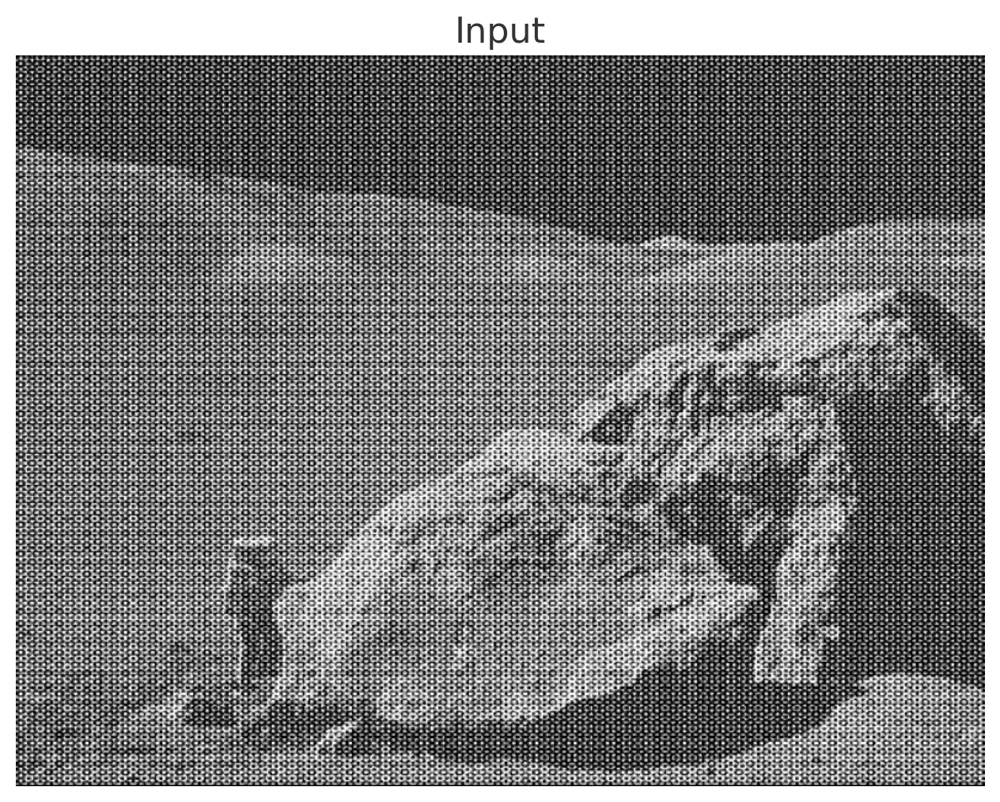

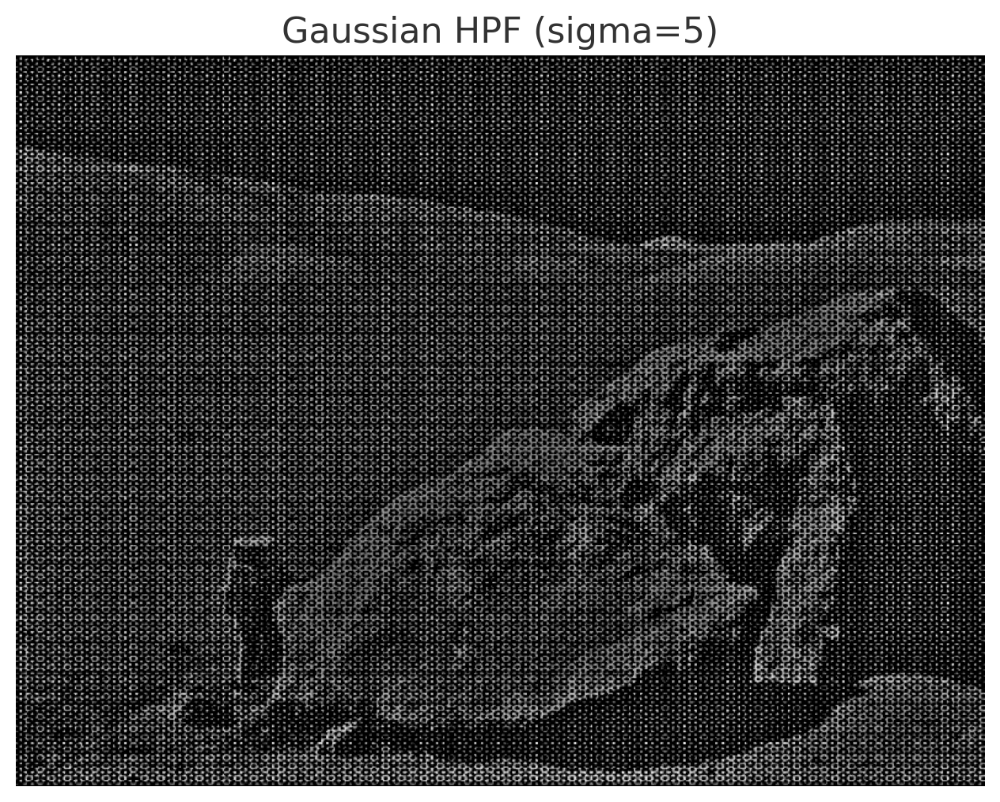

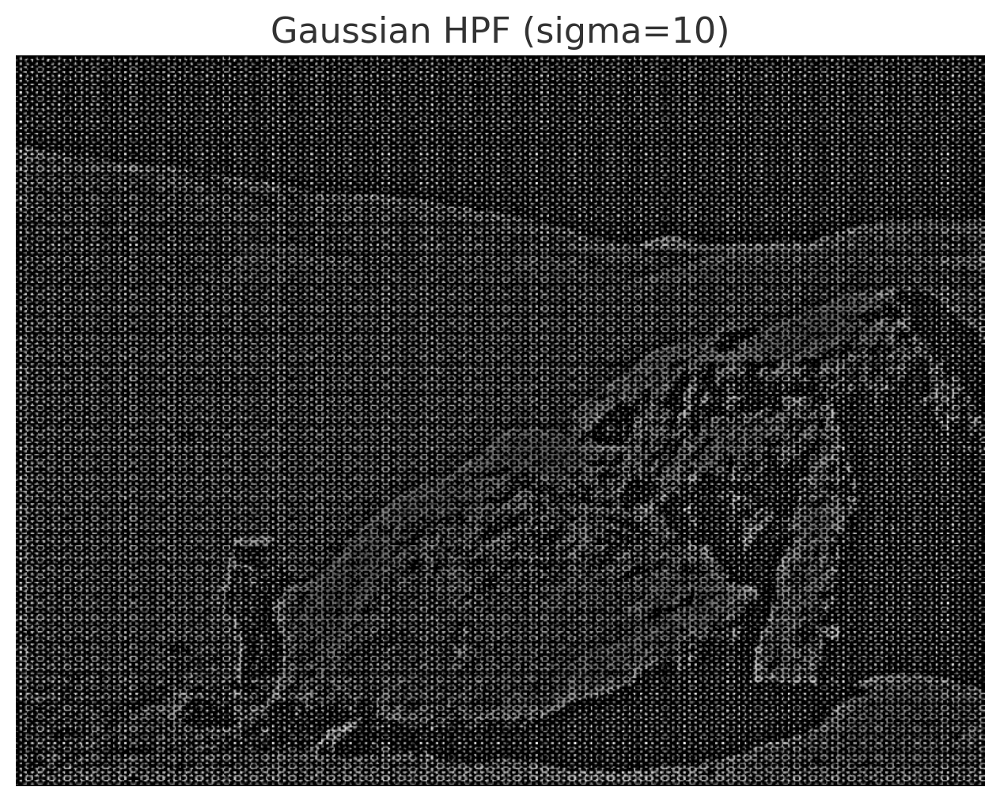

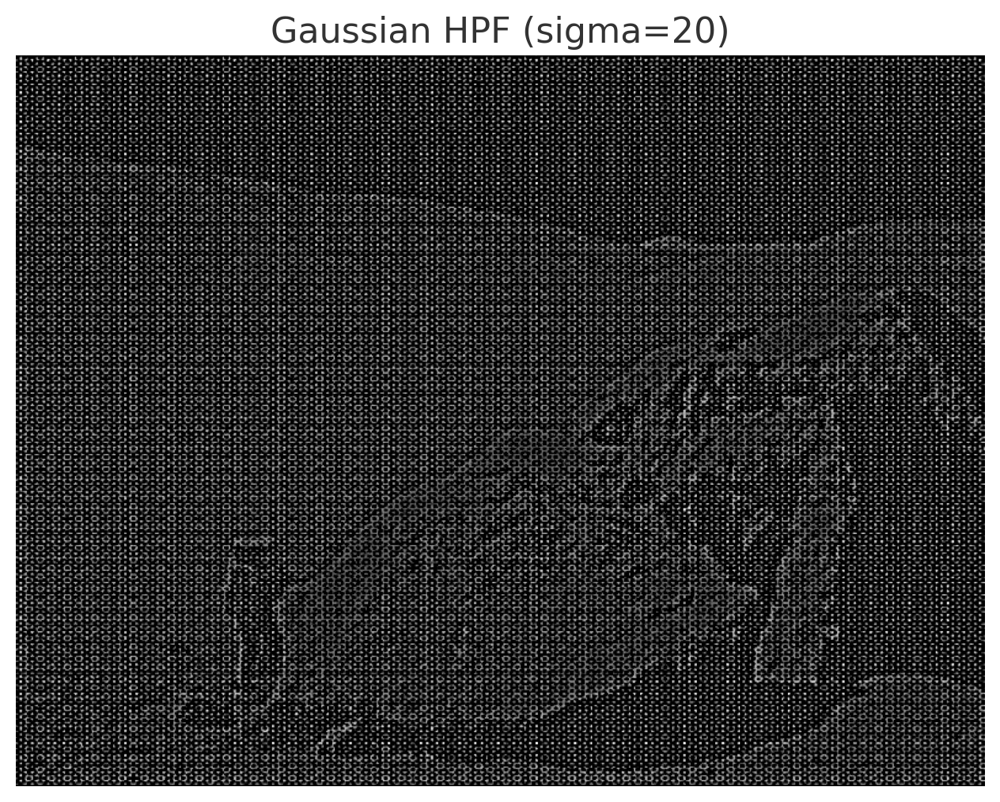

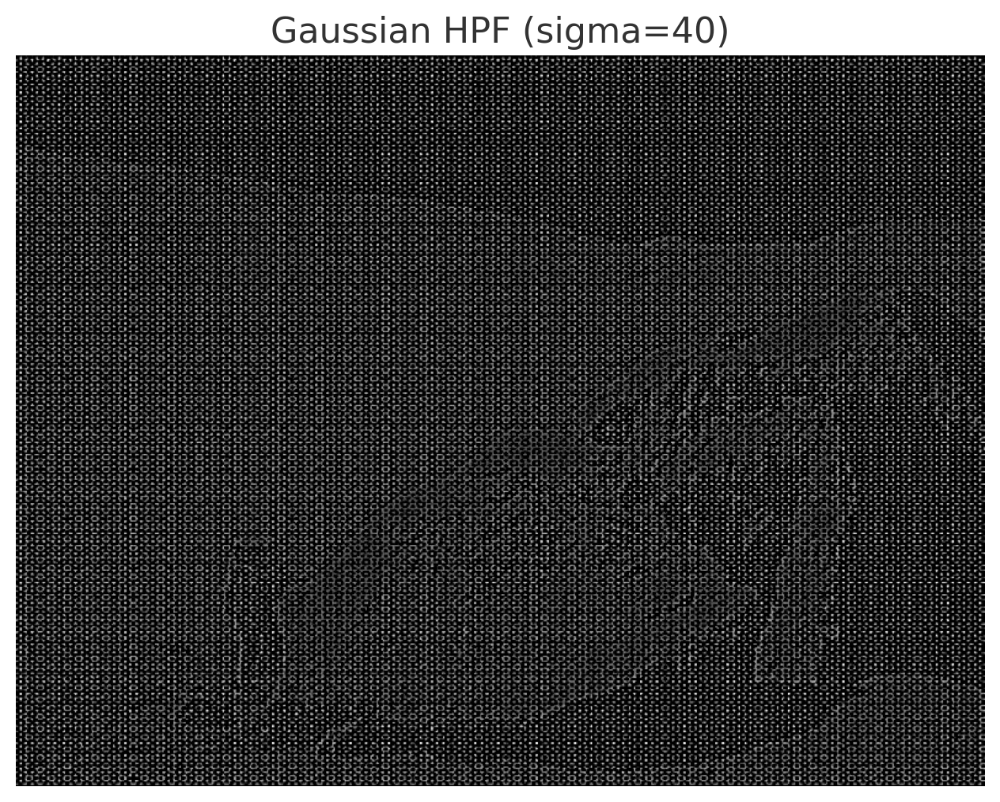

In [3]:

img = imread_gray(IMG_PATH)
show(img, "Input")

sigmas = [5, 10, 20, 40]
for s in sigmas:
    out, H, F, G = apply_hpf_gauss(img, s)
    show(out, f"Gaussian HPF (sigma={s})")
print("HPF done for sigmas:", sigmas)


## 2. Periodic noise removal (frequency-domain notch filtering)

Detected centers (u,v): [(-297, 0), (-179, 0), (-127, -125), (-127, 125), (-73, 0), (-52, -52), (-52, 52), (-47, 0), (0, -178), (0, -73), (0, 73), (0, 176), (47, 0), (52, -52), (52, 52), (73, 0), (124, -125), (124, 125), (176, 0), (296, 0)] ... total: 20


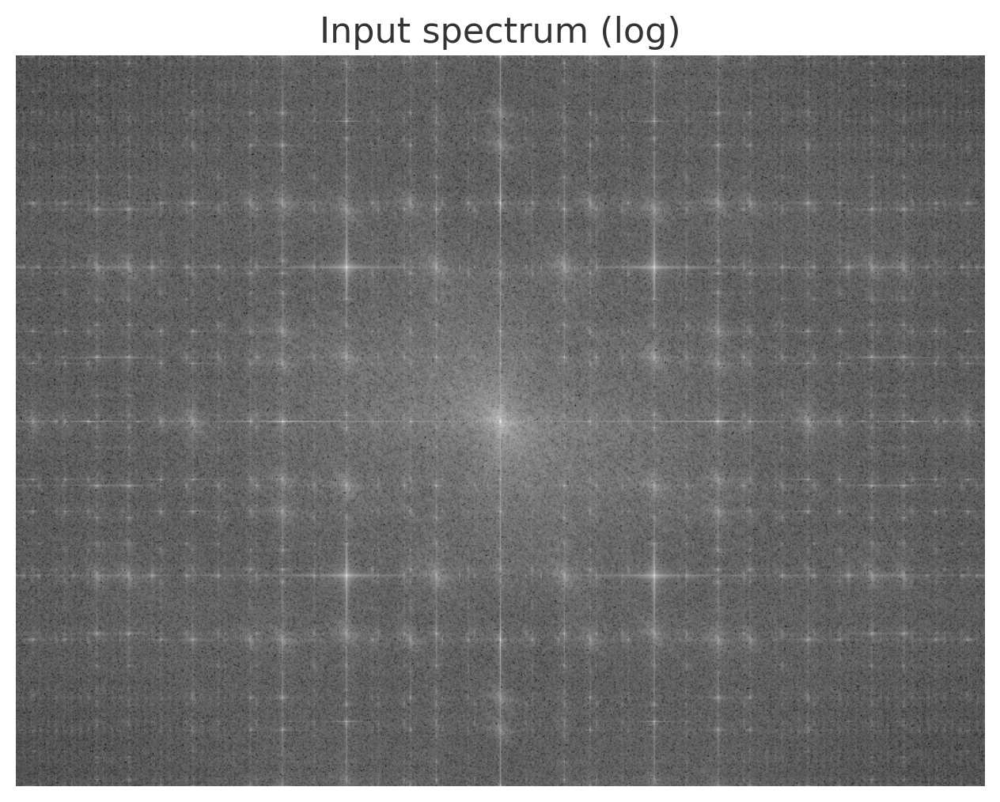

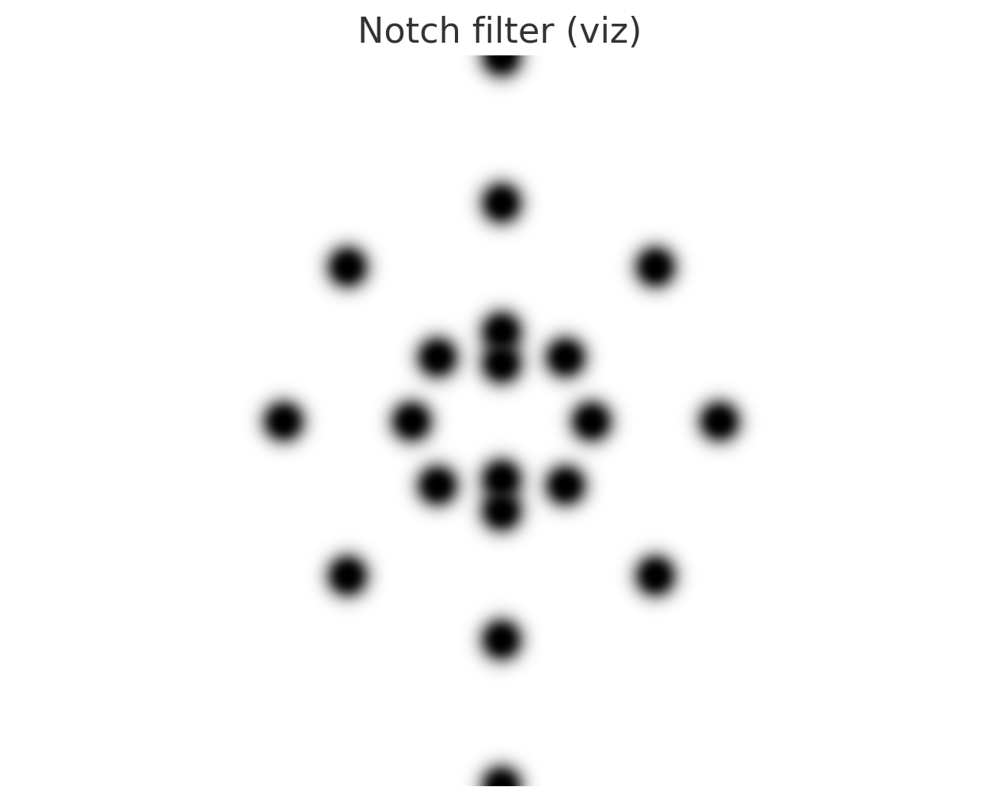

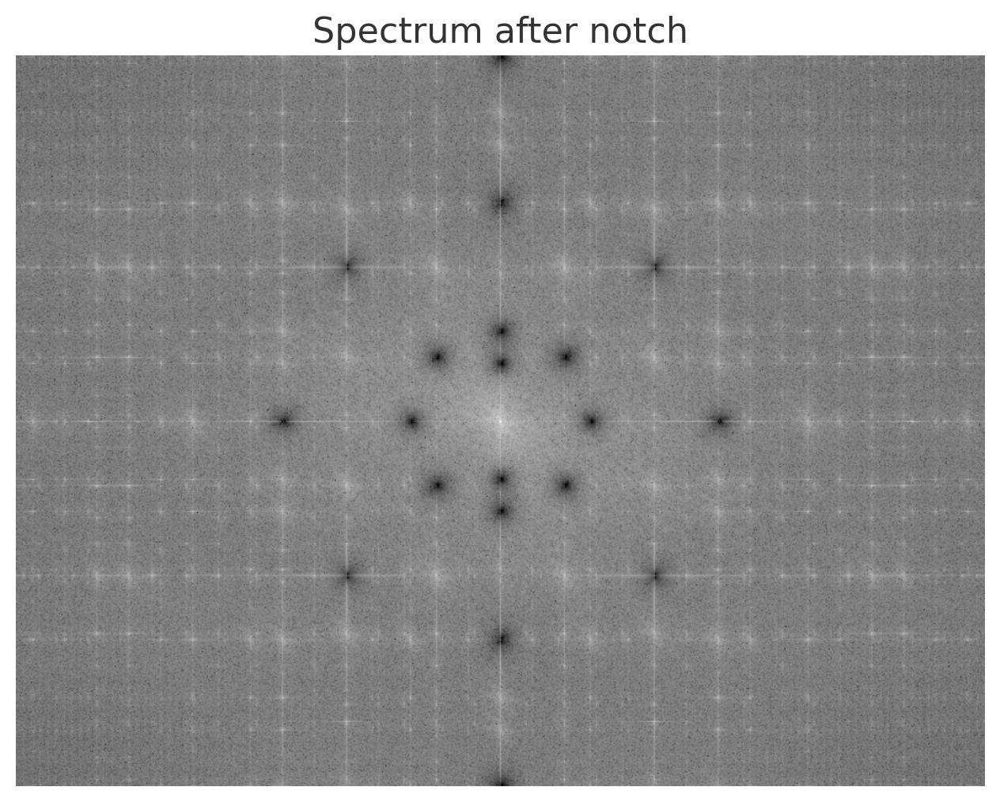

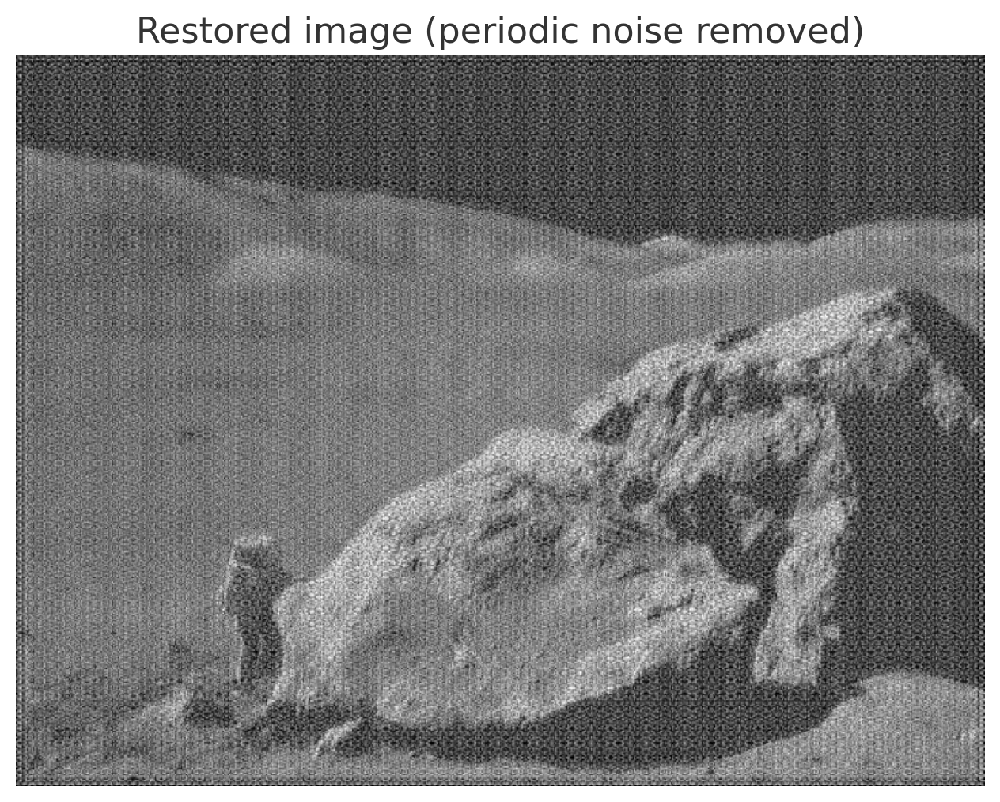

In [4]:

F = fft2(img)
plot_spectrum(F, "Input spectrum (log)")

centers = auto_notch_centers(F, k_std=6.0, min_dist=12)
print("Detected centers (u,v):", centers[:20], "... total:", len(centers))

Hn = notch_gaussian(img.shape, centers, sigma=10)
show(norm01(Hn), "Notch filter (viz)")

G = F * Hn
restored = ifft2(G)
restored_u8 = np.clip(restored, 0, 255).astype(np.uint8)

plot_spectrum(G, "Spectrum after notch")
show(restored_u8, "Restored image (periodic noise removed)")
